In [1]:
import pandas as pd
import plotly.express as px

* Diamonds dataset from [https://www.kaggle.com/shivam2503/diamonds](https://www.kaggle.com/shivam2503/diamonds)

* You can see many examples of plots using plotly and plotly express at [https://plotly.com/python/statistical-charts/](https://plotly.com/python/statistical-charts/)

In [2]:
diamonds = pd.read_csv("diamonds.csv.zip")

In [3]:
diamonds.head()

,Unnamed: 0,carat,cut,color,clarity,depth,table,price,x,y,z
0,1,0.23,Ideal,E,SI2,61.5,55.0,326,3.95,3.98,2.43
1,2,0.21,Premium,E,SI1,59.8,61.0,326,3.89,3.84,2.31
2,3,0.23,Good,E,VS1,56.9,65.0,327,4.05,4.07,2.31
3,4,0.29,Premium,I,VS2,62.4,58.0,334,4.20,4.23,2.63
4,5,0.31,Good,J,SI2,63.3,58.0,335,4.34,4.35,2.75


## Bar chart

In [4]:
counts_color = diamonds.groupby('color').count()
counts_color

,Unnamed: 0,carat,cut,clarity,depth,table,price,x,y,z
color,,,,,,,,,,
D,6775,6775,6775,6775,6775,6775,6775,6775,6775,6775
E,9797,9797,9797,9797,9797,9797,9797,9797,9797,9797
F,9542,9542,9542,9542,9542,9542,9542,9542,9542,9542
G,11292,11292,11292,11292,11292,11292,11292,11292,11292,11292
H,8304,8304,8304,8304,8304,8304,8304,8304,8304,8304
I,5422,5422,5422,5422,5422,5422,5422,5422,5422,5422
J,2808,2808,2808,2808,2808,2808,2808,2808,2808,2808


<AxesSubplot:xlabel='color'>

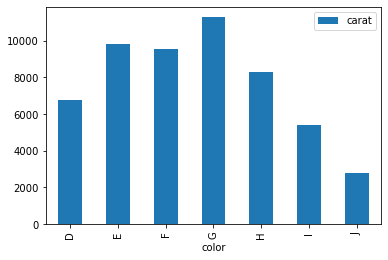

In [5]:
counts_color.plot.bar(y='carat')

In [6]:
px.bar(counts_color['carat'])

In [7]:
px.bar(counts_color['carat'], color=counts_color.index)

# Histogram

In [8]:
px.histogram(diamonds, x='color')

In [9]:
px.histogram(diamonds, x='color', color='color', 
             category_orders={'color':['D','E', 'F', 'G', 'H', 'I', 'J']})

In [10]:
px.histogram(diamonds, x='carat')

In [11]:
px.histogram(diamonds, x='carat', nbins=5)

array([[<AxesSubplot:title={'center':'carat'}>]], dtype=object)

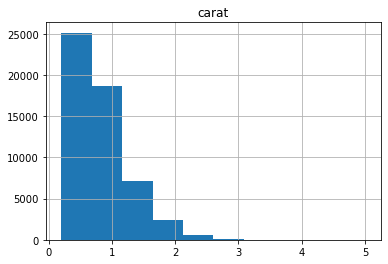

In [12]:
diamonds.hist('carat')

## Boxplots, violin plots

In [13]:
diamonds['price per carat'] = diamonds['price']/diamonds['carat']
px.box(diamonds, x="color", y="price per carat",
       category_orders={'color':['D','E', 'F', 'G', 'H', 'I', 'J']})

In [14]:
px.violin(diamonds, x="color", y="price per carat", color='color',
          category_orders={'color':['D','E', 'F', 'G', 'H', 'I', 'J']})

## Scatterplots

In [15]:
px.scatter(diamonds, x='price', y='carat', color = 'color')

## Grouped and Stacked Bar Chart
Often you need to manipulate the data so that it is ready for visualisation. The following code uses pandas' pivot table function to calculate the average price per diamond cut and colour.

In [16]:
prices_per_cut_per_color = diamonds.pivot_table(index='cut',columns='color',values='price',aggfunc="mean")
prices_per_cut_per_color

color,D,E,F,G,H,I,J
cut,,,,,,,
Fair,4291.061350,3682.312500,3827.003205,4239.254777,5135.683168,4685.445714,4975.655462
Good,3405.382175,3423.644159,3495.750275,4123.482204,4276.254986,5078.532567,4574.172638
Ideal,2629.094566,2597.550090,3374.939362,3720.706388,3889.334831,4451.970377,4918.186384
Premium,3631.292576,3538.914420,4324.890176,4500.742134,5216.706780,5946.180672,6294.591584
Very Good,3470.467284,3214.652083,3778.820240,3872.753806,4535.390351,5255.879568,5103.513274


In [17]:
px.bar(prices_per_cut_per_color, title="Stacked Bar Chart",
       category_orders={'cut':['Fair','Good','Very Good','Ideal','Premium']})

In [18]:
px.bar(prices_per_cut_per_color, barmode="group", labels={'value':'Average price'}, 
       title="Grouped Bar Chart",
       category_orders={'cut':['Fair','Good','Very Good','Ideal','Premium']})

## Faceting

In [19]:
px.histogram(diamonds, x='color', color='color', facet_col='cut',
       title="Faceted Bar Chart",
       category_orders={'color':['D','E', 'F', 'G', 'H', 'I', 'J'],
                        'cut':['Fair','Good','Very Good','Ideal','Premium']})

In [20]:
counts_cut_color = diamonds.groupby(['color','cut']).count().reset_index(1)
counts_cut_color

,cut,Unnamed: 0,carat,clarity,depth,table,price,x,y,z,price per carat
color,,,,,,,,,,,
D,Fair,163,163,163,163,163,163,163,163,163,163
D,Good,662,662,662,662,662,662,662,662,662,662
D,Ideal,2834,2834,2834,2834,2834,2834,2834,2834,2834,2834
D,Premium,1603,1603,1603,1603,1603,1603,1603,1603,1603,1603
D,Very Good,1513,1513,1513,1513,1513,1513,1513,1513,1513,1513
E,Fair,224,224,224,224,224,224,224,224,224,224
E,Good,933,933,933,933,933,933,933,933,933,933
E,Ideal,3903,3903,3903,3903,3903,3903,3903,3903,3903,3903
E,Premium,2337,2337,2337,2337,2337,2337,2337,2337,2337,2337


In [21]:
px.bar(counts_cut_color[['cut','carat']],facet_col='cut', color=counts_cut_color.index,
                        category_orders={'color':['D','E', 'F', 'G', 'H', 'I', 'J'],
                                         'cut':['Fair','Good','Very Good','Ideal','Premium']})